In [1]:
import cv2
import os
from matplotlib import pyplot as plt
import numpy as np
import json
from sklearn.model_selection import train_test_split
from collections import defaultdict, Counter
import time
from tqdm import tqdm
import seaborn as sns
import torch
import random
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as T
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.rpn import AnchorGenerator
import torch.optim as optim

Total unique RGB tuples: 8
Unique RGB values:
(0, 0, 143)
(0, 32, 255)
(0, 191, 255)
(96, 255, 159)
(143, 0, 0)
(175, 0, 0)
(255, 80, 0)
(255, 255, 0)


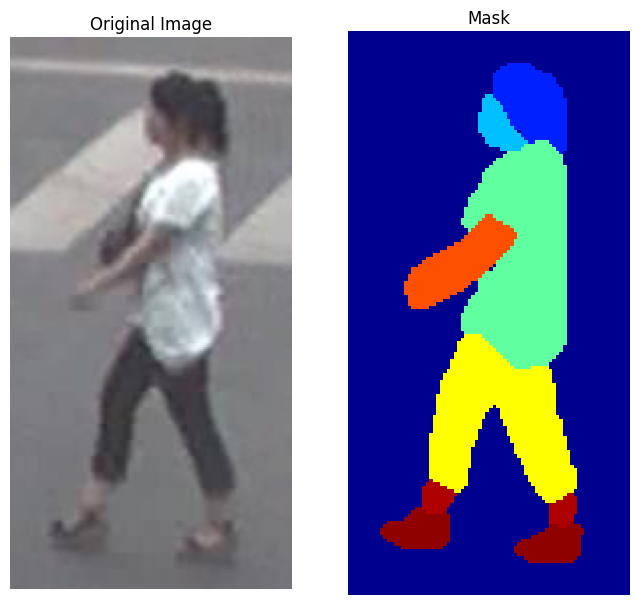

In [ ]:
image_folder = '/kaggle/input/humandetection/Q3/data/data'  

def visualize_image_and_mask(image_filename, mask_filename):
    image_path = os.path.join(image_folder, image_filename)
    mask_path = os.path.join(image_folder, mask_filename)
    
    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path)  
    
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)  
    pixels = mask.reshape(-1, 3)

    unique_rgb_values = np.unique(pixels, axis=0)

    print(f"Total unique RGB tuples: {len(unique_rgb_values)}")
    print("Unique RGB values:")
    for rgb in unique_rgb_values:
        print(tuple(rgb)) 
    
    plt.figure(figsize = (8,8))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(mask)
    plt.title("Mask")
    plt.axis('off')
    
    plt.show()

image_filename = '138/0524_1.jpg'  
mask_filename = '138/0524_1_m.png' 

visualize_image_and_mask(image_filename, mask_filename)

In [ ]:
image_filename = '116/0074_1.jpg'  
mask_filename = '116/0074_1_m.png' 

visualize_image_and_mask(image_filename, mask_filename)

## Check all unique intensity values

In [ ]:
# from PIL import Image
# import os

# # Path to the main image folder
# image_folder = '/kaggle/input/humandetection/Q3/data/data'

# # Initialize an empty set to store unique RGB tuples
# unique_rgb_values = set()

# # Loop through all numbered subfolders (1 to 171)
# for subfolder_num in range(1, 172):  # Subfolders are numbered 1 to 171
#     subfolder_path = os.path.join(image_folder, str(subfolder_num))
    
#     # Check if the subfolder exists
#     if os.path.isdir(subfolder_path):
#         # Loop through all files in the subfolder
#         for img_name in os.listdir(subfolder_path):
#             img_path = os.path.join(subfolder_path, img_name)
            
#             # Only process PNG files
#             if img_name.lower().endswith('.png'):
#                 # Open the image
#                 img = Image.open(img_path)
                
#                 # Convert the image to RGB if it's not already in RGB format
#                 img = img.convert('RGB')
                
#                 # Convert the image to a list of RGB values
#                 pixels = list(img.getdata())
                
#                 # Add the unique RGB values to the set
#                 unique_rgb_values.update(pixels)

# # Print the total number of unique RGB values
# print(f"Total unique RGB tuples: {len(unique_rgb_values)}")
# print("Unique RGB values:")
# for rgb in unique_rgb_values:
#     print(rgb)


### Experimenting to find color code for each category

In [ ]:

# Define the path to the folder containing images and masks
image_folder = '/kaggle/input/humandetection/Q3/data/data/1'  # Replace with the correct path

def visualize_image_and_mask(image_filename, mask_filename):
    # Construct full paths
    image_path = os.path.join(image_folder, image_filename)
    mask_path = os.path.join(image_folder, mask_filename)
    
    # Load the original image and mask
    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path)  # Load mask (ensure it's loaded in BGR format)

    # print(mask())
    

    print(f"Original Image Shape: {image.shape}")
    print(f"Mask Shape: {mask.shape}")
    
    # Define color ranges for each body part (in BGR format)
    color_ranges = {
    'feet': ([0, 0, 143], [0, 0, 143]),  # Expanded range for feet
    'head': ([255, 191, 0], [255, 191, 0]),
    'torso': ([159, 255, 96], [159, 255, 96]),  # Expanded range for torso
    'pants': ([0, 255, 255], [0, 255, 255]),  # Yellow shades for legs
    'hands': ([0, 80, 255], [0, 80, 255]),  # Expanded orange shades for hands
    'hair': ([255, 32, 0], [255, 32, 0]),  # Expanded blue shades for hair
    'legs': ([0, 0, 175], [0, 0, 175])
}

    
    # Create masks for each body part
    body_part_masks = {}
    for part, (lower, upper) in color_ranges.items():
        lower = np.array(lower, dtype=np.uint8)
        upper = np.array(upper, dtype=np.uint8)
        
        # Apply the mask for the body part
        part_mask = cv2.inRange(mask, lower, upper)
        body_part_masks[part] = part_mask
    
    # Display the original image, mask, and individual body part masks
    plt.figure(figsize=(12, 8))
    
    # Original Image
    plt.subplot(3, 3, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis('off')

    # Mask
    plt.subplot(3, 3, 2)
    plt.imshow(mask)
    plt.title("Mask")
    plt.axis('off')
    
    # Display each body part mask
    for idx, (part, part_mask) in enumerate(body_part_masks.items()):
        plt.subplot(3, 3, idx + 3)
        plt.imshow(part_mask, cmap='gray')
        plt.title(f"{part.capitalize()} Mask")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Load one example image and its corresponding mask
image_filename = '0024_15.jpg'  # Replace with an image filename from your folder
mask_filename = '0024_15_m.png'  # Replace with the corresponding mask filename

visualize_image_and_mask(image_filename, mask_filename)

### 4.1 Create annotations

In [ ]:
dataset_folder = '/kaggle/input/humandetection/Q3/data/data/'

# Body part BGR values (example, adjust these with actual BGR values for each part)
body_part_colors = {
    'feet': [0, 0, 143],
    'head': [255, 191, 0],
    'torso': [159, 255, 96],
    'pants': [0, 255, 255],
    'hands': [0, 80, 255],
    'hair': [255, 32, 0],
    'legs' : [0, 0, 175]
}

# Function to convert segmentation masks to bounding boxes
def convert_mask_to_bboxes(image_filename, mask_filename, folder_id):
    # Load the original image to get its size
    image_path = os.path.join(dataset_folder, str(folder_id), image_filename)
    original_image = cv2.imread(image_path)

    if original_image is None:
        print(f"Error: Failed to load original image {image_path}.")
        return []

    orig_h, orig_w = original_image.shape[:2]  # Get original image dimensions

    # Load the mask image
    mask_path = os.path.join(dataset_folder, str(folder_id), mask_filename)
    
    if not os.path.exists(mask_path):
        print(f"Warning: Mask file {mask_path} not found.")
        return []

    mask = cv2.imread(mask_path)

    if mask is None:
        print(f"Error: Failed to load mask {mask_path}.")
        return []

    # Resize mask to match original image size
    mask = cv2.resize(mask, (orig_w, orig_h), interpolation=cv2.INTER_NEAREST)

    bboxes = []
    for body_part, color in body_part_colors.items():
        # Create a binary mask for the body part by checking for the specific color
        part_mask = np.all(mask == color, axis=-1).astype(np.uint8) * 255

        # Find contours in the mask
        contours, _ = cv2.findContours(part_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Create bounding boxes for each contour
        for cnt in contours:
            x, y, w, h = cv2.boundingRect(cnt)
            bboxes.append({'class': body_part, 'bbox': [x, y, x + w, y + h]})

    return bboxes

# Function to save annotations to a JSON file
def save_annotations(annotations, output_file='annotations.json'):
    with open(output_file, 'w') as f:
        json.dump(annotations, f, indent=4)

# Main function to process the dataset
def process_dataset(dataset_folder):
    annotations = []

    # Traverse through each folder (1, 2, ..., 171)
    for folder_id in range(1, 172):
        folder_path = os.path.join(dataset_folder, str(folder_id))
        image_filenames = os.listdir(folder_path)
        
        image_files = [f for f in image_filenames if f.endswith('.jpg')]
        mask_files = [f for f in image_filenames if f.endswith('_m.png')]

        for image_filename in image_files:
            # Match the corresponding mask file by replacing the extension
            mask_filename = image_filename.replace('.jpg', '_m.png')
            
            if mask_filename in mask_files:
                # Convert segmentation mask to bounding boxes
                bboxes = convert_mask_to_bboxes(image_filename, mask_filename, folder_id)

                if bboxes:  # Only append if bounding boxes are found
                    annotations.append({'image': os.path.join(str(folder_id), image_filename), 'bboxes': bboxes})

    # Split dataset into training and validation sets
    image_filenames = [annotation['image'] for annotation in annotations]
    print(f"Total annotations before splitting: {len(annotations)}")
    
    # Save the annotations to a JSON file
    save_annotations(annotations)

    return annotations, image_filenames
annotations, train_images = process_dataset(dataset_folder)

Total annotations before splitting: 3961


## Load annotations

In [ ]:
# import json
# json_path = "/kaggle/working/annotations.json"

# with open(json_path, "r") as f:
#     annotations = json.load(f)

In [4]:
print("Sample annotations:")
for annotation in annotations[20:25]: 
    print(annotation)

Sample annotations:
{'image': '1/0274_3.jpg', 'bboxes': [{'class': 'feet', 'bbox': [103, 396, 145, 420]}, {'class': 'feet', 'bbox': [134, 343, 170, 373]}, {'class': 'torso', 'bbox': [42, 86, 173, 246]}, {'class': 'pants', 'bbox': [67, 230, 159, 404]}, {'class': 'hands', 'bbox': [159, 188, 181, 235]}, {'class': 'hair', 'bbox': [59, 23, 120, 86]}]}
{'image': '1/0574_5.jpg', 'bboxes': [{'class': 'feet', 'bbox': [56, 244, 99, 259]}, {'class': 'head', 'bbox': [49, 40, 69, 48]}, {'class': 'torso', 'bbox': [28, 43, 125, 128]}, {'class': 'pants', 'bbox': [47, 126, 102, 247]}, {'class': 'hands', 'bbox': [30, 106, 45, 113]}, {'class': 'hands', 'bbox': [121, 70, 138, 89]}, {'class': 'hair', 'bbox': [49, 14, 78, 41]}]}
{'image': '1/0874_19.jpg', 'bboxes': [{'class': 'feet', 'bbox': [82, 237, 101, 253]}, {'class': 'feet', 'bbox': [46, 237, 70, 252]}, {'class': 'torso', 'bbox': [34, 49, 113, 136]}, {'class': 'pants', 'bbox': [43, 129, 106, 240]}, {'class': 'hands', 'bbox': [21, 116, 46, 153]}, {'cla

### 4.1.2 EDA

In [ ]:
def visualize_annotations(image_filename, annotations, dataset_folder):
    """
    Displays the original image, the segmentation mask, and the image with bounding boxes.
    """
    folder_id = image_filename.split('/')[0]  # Extract folder ID
    image_path = os.path.join(dataset_folder, image_filename)
    mask_path = image_path.replace('.jpg', '_m.png')

    # Load images
    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path)

    if image is None:
        print(f"Error: Could not load {image_path}")
        return
    if mask is None:
        print(f"Error: Could not load {mask_path}")
        return

    # Convert image from BGR to RGB for correct color display
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    mask_rgb = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

    # Draw bounding boxes on a copy of the original image
    image_with_bboxes = image_rgb.copy()
    
    for ann in annotations:
        if ann['image'] == image_filename:
            for bbox_info in ann['bboxes']:
                x1, y1, x2, y2 = bbox_info['bbox']
                label = bbox_info['class']
                color = tuple(body_part_colors.get(label, [255, 255, 255]))  # Default to white if label not found
                color = (int(color[0]), int(color[1]), int(color[2]))  # Convert to tuple

                cv2.rectangle(image_with_bboxes, (x1, y1), (x2, y2), color, 1)
                cv2.putText(image_with_bboxes, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

    # Plot the images
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(image_rgb)
    axes[0].set_title("Original Image")
    axes[1].imshow(mask_rgb)
    axes[1].set_title("Segmentation Mask")
    axes[2].imshow(image_with_bboxes)
    axes[2].set_title("Image with BBoxes")

    for ax in axes:
        ax.axis("off")

    plt.show()

# Example usage
visualize_annotations('1/0024_15.jpg', annotations, dataset_folder)

In [ ]:
visualize_annotations('168/0274_5.jpg', annotations, dataset_folder)

In [ ]:
visualize_annotations('138/0124_3.jpg', annotations, dataset_folder)

In [ ]:
visualize_annotations('138/0524_1.jpg', annotations, dataset_folder)


## Histogram of parts frequency

In [ ]:
part_counts = Counter()
for entry in annotations:
    for bbox in entry['bboxes']:
        part_counts[bbox['class']] += 1

# Plot distribution
plt.figure(figsize=(8, 5))
plt.bar(part_counts.keys(), part_counts.values(), color='skyblue')
plt.xlabel("Body Part")
plt.ylabel("Count")
plt.title("Distribution of Body Parts in Dataset")
plt.xticks(rotation=45)
plt.show()

## Distribution of box parameters

In [ ]:
widths = []
heights = []
aspect_ratios = []
positions = []

for entry in annotations:
    for bbox in entry['bboxes']:
        x1, y1, x2, y2 = bbox["bbox"]
        width = x2 - x1
        height = y2 - y1
        aspect_ratio = width / height if height > 0 else 0
        center_x = (x1 + x2) / 2
        center_y = (y1 + y2) / 2

        widths.append(width)
        heights.append(height)
        aspect_ratios.append(aspect_ratio)
        positions.append((center_x, center_y))

# Plot distributions
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.histplot(widths, bins=20, kde=True, color='blue')
plt.xlabel("Width")
plt.title("Distribution of BBox Widths")

plt.subplot(1, 3, 2)
sns.histplot(heights, bins=20, kde=True, color='red')
plt.xlabel("Height")
plt.title("Distribution of BBox Heights")

plt.subplot(1, 3, 3)
sns.histplot(aspect_ratios, bins=20, kde=True, color='green')
plt.xlabel("Aspect Ratio (Width / Height)")
plt.title("Distribution of BBox Aspect Ratios")

plt.tight_layout()
plt.show()

In [ ]:
# Detect extreme aspect ratios
extreme_aspect_ratios = [ar for ar in aspect_ratios if ar < 0.2 or ar > 5]
print(f"Extreme Aspect Ratios Count: {len(extreme_aspect_ratios)}")

# Detect missing parts
part_set = {'head', 'torso', 'legs', 'feet', 'hands', 'hair'}
missing_counts = Counter()
for entry in annotations:
    present_parts = {bbox["class"] for bbox in entry["bboxes"]}
    missing_parts = part_set - present_parts
    for part in missing_parts:
        missing_counts[part] += 1

print("Missing Part Counts:", missing_counts)

# Check bbox overlap (Naive method)
def bbox_intersection(bbox1, bbox2):
    x1_1, y1_1, x2_1, y2_1 = bbox1
    x1_2, y1_2, x2_2, y2_2 = bbox2
    xi1, yi1 = max(x1_1, x1_2), max(y1_1, y1_2)
    xi2, yi2 = min(x2_1, x2_2), min(y2_1, y2_2)
    if xi1 < xi2 and yi1 < yi2:
        return True  # Overlapping
    return False

overlapping_bboxes = 0
for entry in annotations:
    bboxes = [bbox["bbox"] for bbox in entry["bboxes"]]
    for i in range(len(bboxes)):
        for j in range(i+1, len(bboxes)):
            if bbox_intersection(bboxes[i], bboxes[j]):
                overlapping_bboxes += 1

print(f"Overlapping Bounding Boxes: {overlapping_bboxes}")

## 4.2 Model implementation

### Dataloaders

In [5]:
# Class name to numeric label mapping
CLASS_MAP = {
    'hands': 1,
    'hair': 2,
    'pants': 3,
    'legs': 4,
    'head': 5,
    'torso': 6,
    'feet': 7,
}

# Image parent folder
IMAGE_FOLDER = '/kaggle/input/humandetection/Q3/data/data/'

random.shuffle(annotations)

# Split into 80% train, 10% val, 10% test
train_size = int(0.7 * len(annotations))
val_size = int(0.1 * len(annotations))
test_size = len(annotations) - train_size - val_size

train_data = annotations[:train_size]
val_data = annotations[train_size:train_size + val_size]
test_data = annotations[train_size + val_size:]

In [6]:
class HumanDetectionDataset(torch.utils.data.Dataset):
    def __init__(self, annotations, image_folder, transform=None):
        self.annotations = annotations
        self.image_folder = image_folder
        self.transform = transform  # Ensure transform is stored

    def __getitem__(self, idx):
        # Load image
        img_path = os.path.join(self.image_folder, self.annotations[idx]['image'])
        image = Image.open(img_path).convert("RGB")  # Ensure RGB format

        # Apply transformation (convert to tensor)
        if self.transform:
            image = self.transform(image)  # Convert to PyTorch tensor here

        # Process annotations
        bboxes = torch.tensor([ann['bbox'] for ann in self.annotations[idx]['bboxes']], dtype=torch.float32)
        labels = torch.tensor([CLASS_MAP[ann['class']] for ann in self.annotations[idx]['bboxes']], dtype=torch.int64)
        # print(len(labels))
        target = {"boxes": bboxes, "labels": labels}
        return image, target

    def __len__(self):
        return len(self.annotations)

# Define transformation (convert images to tensors)
train_transform = T.Compose([
    # T.GaussianBlur(kernel_size=5, sigma=(0.1, 2.0)),  # Apply Gaussian Blur
    # T.ColorJitter(contrast=0.2), # Adjust contrast
    T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.05),
    T.ToTensor()])  # Use Compose for safety

val_transform = T.Compose([
    T.ToTensor()])

# Create dataset instances with transform
train_dataset = HumanDetectionDataset(train_data, IMAGE_FOLDER, transform = train_transform)
val_dataset = HumanDetectionDataset(val_data, IMAGE_FOLDER, transform=val_transform)
test_dataset = HumanDetectionDataset(test_data, IMAGE_FOLDER, transform=val_transform)

In [7]:
# Define DataLoader with collate function
def collate_fn(batch):
    images, targets = zip(*batch)
    images = list(images)
    targets = list(targets)
    return images, targets

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, collate_fn=collate_fn)

In [ ]:
# for images, targets in train_loader:
#     # Assuming targets is a list of dictionaries, we need to check each target's "labels"
#     for target in targets:
#         labels = target["labels"]
#         if len(labels) == 0:
#             print("Empty labels")

### Model

In [8]:
# Load the Faster R-CNN model (pretrained on COCO)
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

num_classes = 8       # 7 body parts + background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

anchor_sizes = ((32,), (64,), (128,), (256,), (512,))  
aspect_ratios = ((0.5, 1.0, 2.0),) * len(anchor_sizes)  

anchor_generator = AnchorGenerator(sizes=anchor_sizes, aspect_ratios=aspect_ratios)
model.rpn.anchor_generator = anchor_generator

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

optimizer = optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=1e-4)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [9]:
def train_fasterrcnn(model, train_loader, val_loader, num_epochs=10):
    model.train()  # Set to training mode

    for epoch in range(num_epochs):
        epoch_loss = 0
        start_time = time.time()

        for images, targets in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}"):
            # Move images and targets to device
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in t.items()} for t in targets]

            # Zero gradients
            optimizer.zero_grad()

            # Forward pass
            loss_dict = model(images, targets)  # Returns a dictionary of loss values
            loss = sum(loss for loss in loss_dict.values())  # Total loss

            # Backpropagation
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()

        # Reduce learning rate if needed
        lr_scheduler.step()

        # Print Epoch Loss
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}, Time: {time.time() - start_time:.2f}s")

    print("Training Completed!")

In [ ]:
train_fasterrcnn(model, train_loader, val_loader, num_epochs=8)

In [ ]:
def train_fasterrcnn(model, train_loader, val_loader, num_epochs=10, patience=3, device='cpu'):
    model.to(device)  # Move model to device
    model.train()  # Set to training mode
    best_val_iou = 0.0  # Best validation IoU
    epochs_without_improvement = 0  # Counter for early stopping

    for epoch in range(num_epochs):
        epoch_loss = 0
        start_time = time.time()

        for images, targets in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}"):
            # Move images and targets to device
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in t.items()} for t in targets]

            # Zero gradients
            optimizer.zero_grad()

            # Forward pass
            loss_dict = model(images, targets)  # Returns a dictionary of loss values
            loss = sum(loss for loss in loss_dict.values())  # Total loss

            # Backpropagation
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()

        # Reduce learning rate if needed
        lr_scheduler.step()

        # Print Epoch Loss
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}, Time: {time.time() - start_time:.2f}s")

        # Validate and compute IoU on validation set
        model.eval()  # Set to evaluation mode
        with torch.no_grad():
            total_iou = 0.0
            total_images = 0

            for images, targets in val_loader:
                images = [img.to(device) for img in images]
                targets = [{k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in t.items()} for t in targets]

                # Perform inference
                predictions = model(images)

                for i in range(len(images)):
                    pred_boxes = predictions[i]['boxes']
                    pred_labels = predictions[i]['labels']
                    target_boxes = targets[i]['boxes']
                    target_labels = targets[i]['labels']
                    
                    # Compute IoU for this image and accumulate it
                    mean_iou = compute_mean_iou(pred_boxes, pred_labels, target_boxes, target_labels, num_classes=7)  
                    total_iou += mean_iou
                    total_images += 1

            avg_iou = total_iou / total_images
            print(f"Validation IoU: {avg_iou:.4f}")

            # Early stopping check based on IoU improvement
            if avg_iou > best_val_iou:
                best_val_iou = avg_iou
                epochs_without_improvement = 0  # Reset patience counter
            else:
                epochs_without_improvement += 1

            # Check if early stopping should be triggered
            if epochs_without_improvement >= patience:
                print(f"Early stopping triggered. No improvement in IoU for {patience} epochs.")
                break

        # Set back to training mode after validation
        model.train()

    print("Training Completed!")


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
train_fasterrcnn(model, train_loader, val_loader, num_epochs=10, patience=3, device=device)

In [ ]:
# import matplotlib.patches as patches
# from torchvision.ops import nms

# def plot_boxes(image, gt_boxes, gt_labels, pred_boxes, pred_labels, title=""):
#     """
#     Visualizes the image with both ground truth and predicted bounding boxes.
    
#     Args:
#         image: The input image (PIL image).
#         gt_boxes: List of ground truth bounding boxes (tensor).
#         gt_labels: List of ground truth labels (tensor).
#         pred_boxes: List of predicted bounding boxes (tensor).
#         pred_labels: List of predicted labels (tensor).
#         title: Title for the plot.
#     """
#     fig, ax = plt.subplots(1, 2, figsize=(12, 6))
#     mapping = ["hands", "hair", "pants", "legs", "head", "torso", "feet"]

#     # Plot ground truth
#     ax[0].imshow(image)
#     ax[0].set_title(f"Ground Truth - {title}")
#     for box, label in zip(gt_boxes, gt_labels):
#         rect = patches.Rectangle(
#             (box[0], box[1]), 
#             box[2] - box[0], 
#             box[3] - box[1], 
#             linewidth=2, 
#             edgecolor='b', 
#             facecolor='none')
#         ax[0].add_patch(rect)
#         ax[0].text(box[0], box[1] - 5, f"{mapping[label.item()-1]}", color='b', fontsize=12)

#     # Plot predictions
#     ax[1].imshow(image)
#     ax[1].set_title(f"Predictions - {title}")
#     for box, label in zip(pred_boxes, pred_labels):
#         rect = patches.Rectangle(
#             (box[0], box[1]), 
#             box[2] - box[0], 
#             box[3] - box[1], 
#             linewidth=2, 
#             edgecolor='r', 
#             facecolor='none')
#         ax[1].add_patch(rect)
#         ax[1].text(box[0], box[1] - 5, f"{mapping[label.item()-1]}", color='r', fontsize=12)

#     plt.show()


# def visualize_predictions(model, test_loader, num_images=5, device='cpu', score_threshold=0.3, nms_threshold=0.2):
#     """
#     Visualizes predictions of the model on test data by showing side-by-side comparison 
#     of ground truth and predicted bounding boxes, with Non-Maximum Suppression applied.
    
#     Args:
#         model: Trained model for inference.
#         test_loader: DataLoader for the test dataset.
#         num_images: Number of images to visualize.
#         device: Device where the model is located (e.g., 'cpu', 'cuda').
#         score_threshold: Minimum score to keep a predicted box.
#         nms_threshold: IoU threshold for NMS.
#     """
#     model.eval()  # Set the model to evaluation mode

#     with torch.no_grad():  # No gradients needed for inference
#         for images, targets in test_loader:
#             images = [img.to(device) for img in images]
#             targets = [{k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in t.items()} for t in targets]

#             # Perform inference
#             prediction = model(images)

#             # Loop through images in batch and show visualization
#             for i in range(len(images)):
#                 img = images[i].cpu().numpy().transpose(1, 2, 0)  # Convert to HWC format
#                 img = (img * 255).astype("uint8")  # Convert back to [0, 255] for visualization

#                 # Extract ground truth boxes and labels
#                 ground_truth_boxes = targets[i]['boxes'].cpu().numpy()
#                 ground_truth_labels = targets[i]['labels'].cpu()

#                 # Extract predicted boxes, labels, and scores
#                 pred_boxes = prediction[i]['boxes'].cpu()
#                 pred_labels = prediction[i]['labels'].cpu()
#                 pred_scores = prediction[i]['scores'].cpu()  # Assuming the model returns scores

#                 # Apply score threshold (filter out boxes with low scores)
#                 keep = pred_scores > score_threshold
#                 pred_boxes = pred_boxes[keep]
#                 pred_labels = pred_labels[keep]
#                 pred_scores = pred_scores[keep]

#                 # Apply Non-Maximum Suppression (NMS)
#                 keep_nms = nms(pred_boxes, pred_scores, nms_threshold)
#                 pred_boxes = pred_boxes[keep_nms]
#                 pred_labels = pred_labels[keep_nms]

#                 plot_boxes(
#                     Image.fromarray(img), 
#                     ground_truth_boxes, 
#                     ground_truth_labels, 
#                     pred_boxes.numpy(),  # Convert to numpy for plotting
#                     pred_labels.numpy(),  # Convert to numpy for plotting
#                     title=f"Image {i + 1}"
#                 )

#                 # Break if we have displayed enough images
#                 num_images -= 1
#                 if num_images == 0:
#                     return

# # Call this function with your model and test loader to visualize predictions
# visualize_predictions(model, test_loader, num_images=100, device='cuda' if torch.cuda.is_available() else 'cpu')

In [13]:
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import torch
from PIL import Image
from torchvision.ops import nms

def plot_boxes(image, gt_boxes, gt_labels, pred_boxes, pred_labels, title=""):
    """
    Visualizes the image with both ground truth and predicted bounding boxes, 
    using different colors for each class.
    
    Args:
        image: The input image (PIL image).
        gt_boxes: List of ground truth bounding boxes (tensor).
        gt_labels: List of ground truth labels (tensor).
        pred_boxes: List of predicted bounding boxes (tensor).
        pred_labels: List of predicted labels (tensor).
        title: Title for the plot.
    """
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    mapping = ["hands", "hair", "pants", "legs", "head", "torso", "feet"]

    # Assign a unique color to each class
    class_colors = {
        "hands": "blue",
        "hair": "green",
        "pants": "red",
        "legs": "cyan",
        "head": "magenta",
        "torso": "orange",
        "feet": "yellow"
    }

    # Plot Ground Truth Boxes
    ax[0].imshow(image)
    ax[0].set_title(f"Ground Truth - {title}")
    for box, label in zip(gt_boxes, gt_labels):
        class_name = mapping[label.item() - 1]
        color = class_colors[class_name]
        
        rect = patches.Rectangle(
            (box[0], box[1]), box[2] - box[0], box[3] - box[1],
            linewidth=2, edgecolor=color, facecolor='none'
        )
        ax[0].add_patch(rect)
        ax[0].text(box[0], box[1] - 5, class_name, color=color, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

    # Plot Predicted Boxes
    ax[1].imshow(image)
    ax[1].set_title(f"Predictions - {title}")
    for box, label in zip(pred_boxes, pred_labels):
        class_name = mapping[label.item() - 1]
        color = class_colors[class_name]
        
        rect = patches.Rectangle(
            (box[0], box[1]), box[2] - box[0], box[3] - box[1],
            linewidth=2, edgecolor=color, facecolor='none'
        )
        ax[1].add_patch(rect)
        ax[1].text(box[0], box[1] - 5, class_name, color=color, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

    plt.show()


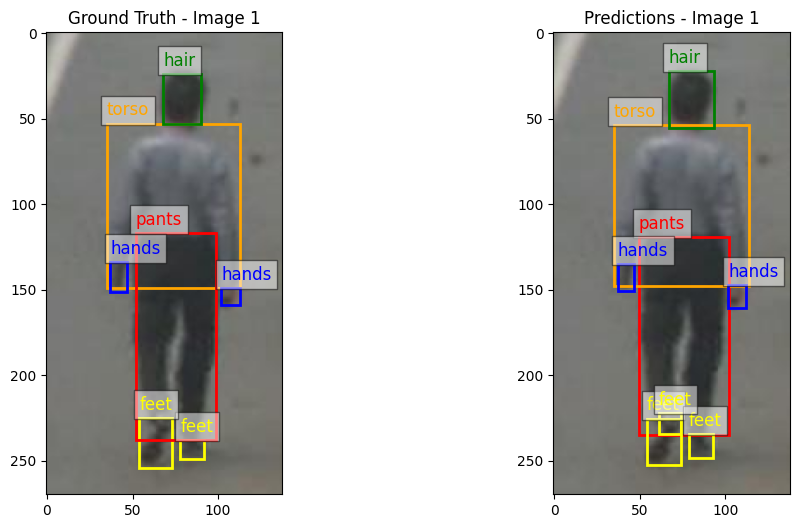

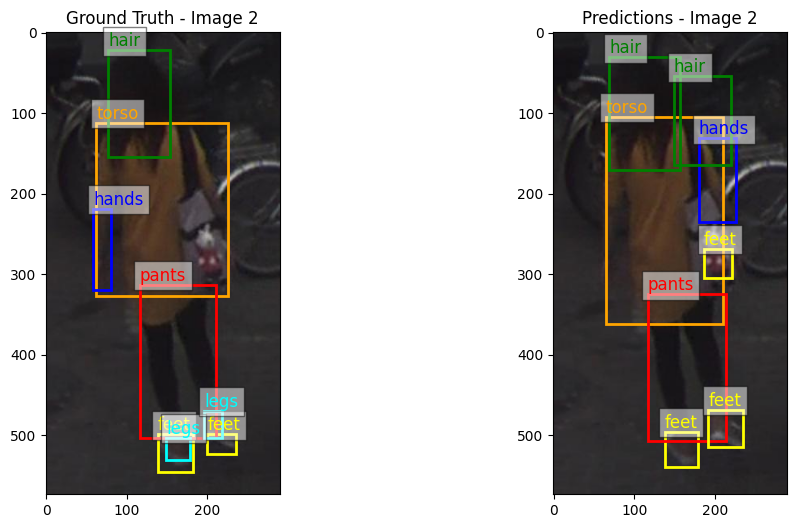

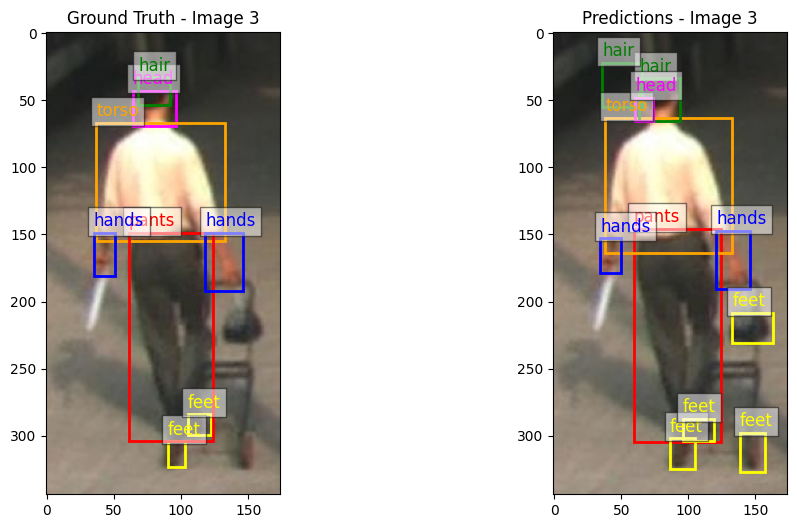

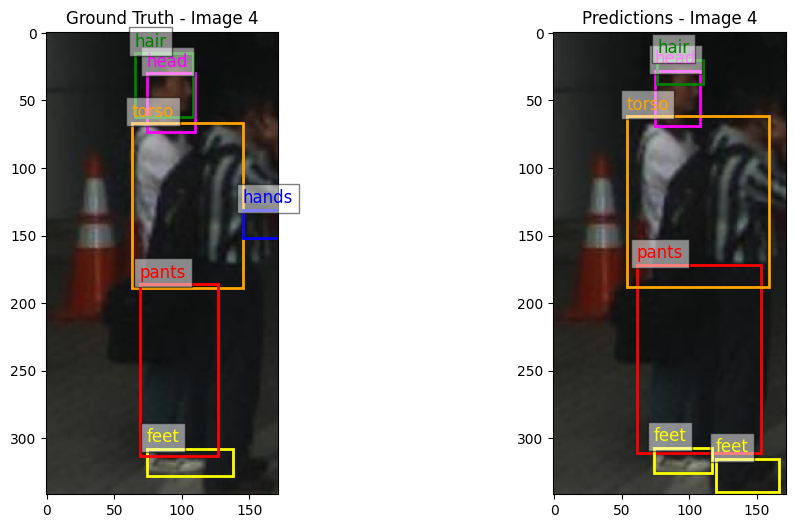

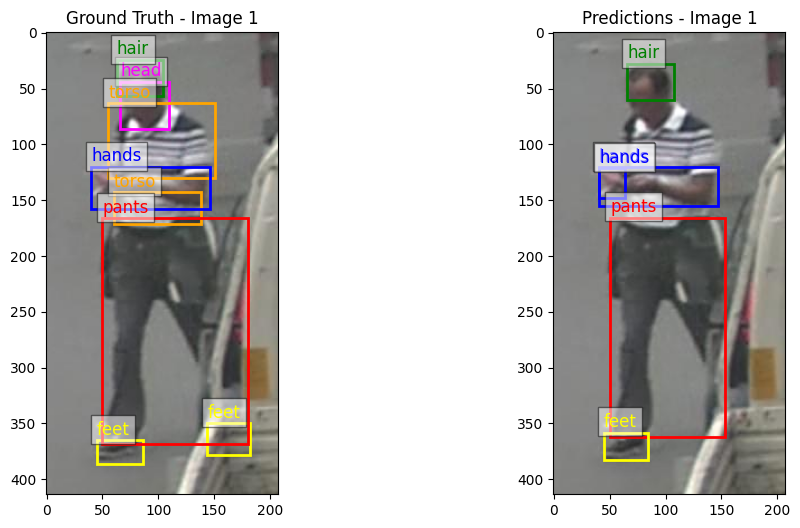

...

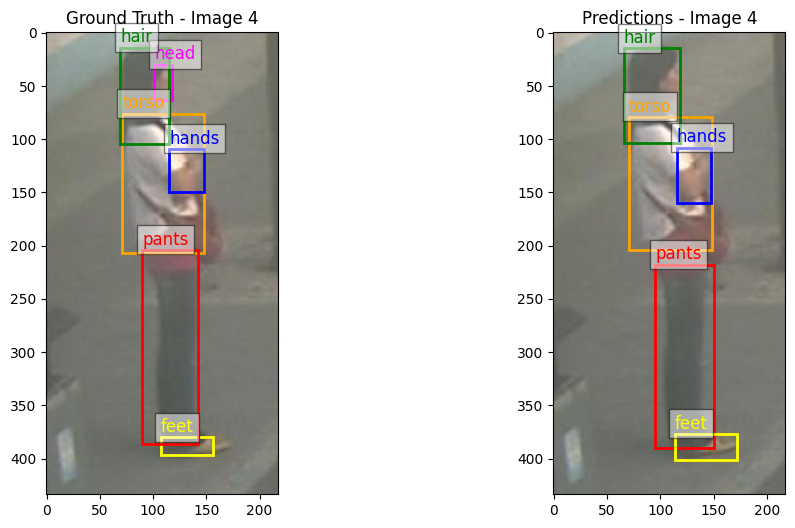

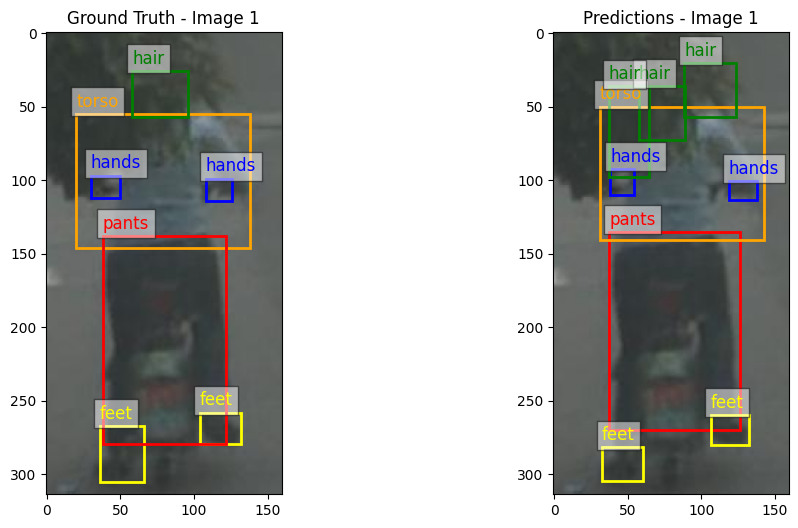

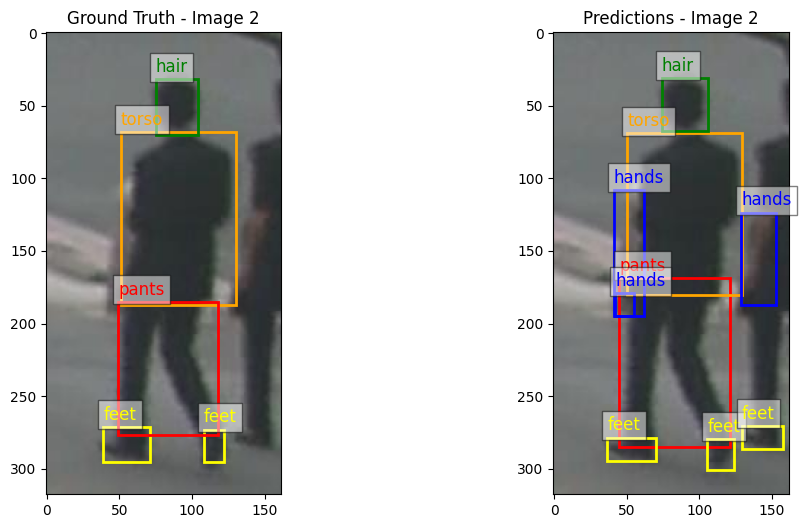

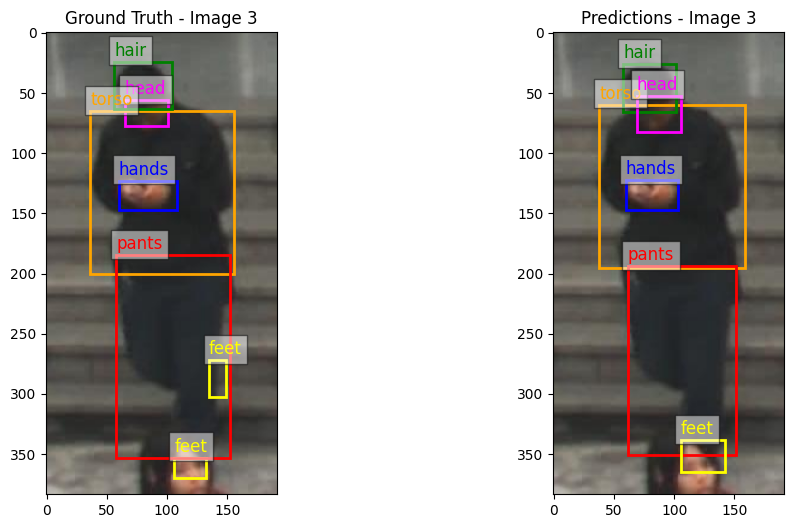

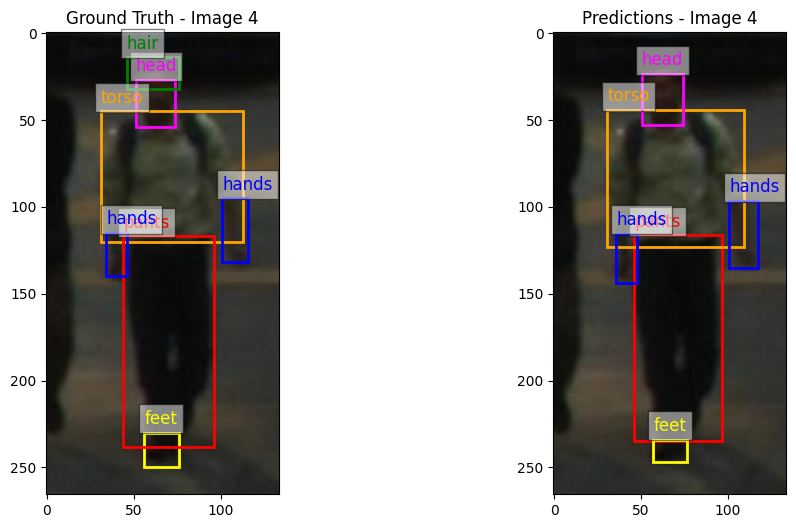

In [14]:
def visualize_predictions(model, test_loader, num_images=5, device='cpu', score_threshold=0.3, nms_threshold=0.2):
    """
    Visualizes predictions of the model on test data by showing side-by-side comparison 
    of ground truth and predicted bounding boxes, with Non-Maximum Suppression applied.
    
    Args:
        model: Trained model for inference.
        test_loader: DataLoader for the test dataset.
        num_images: Number of images to visualize.
        device: Device where the model is located (e.g., 'cpu', 'cuda').
        score_threshold: Minimum score to keep a predicted box.
        nms_threshold: IoU threshold for NMS.
    """
    model.eval()  # Set the model to evaluation mode

    with torch.no_grad():  # No gradients needed for inference
        for images, targets in test_loader:
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in t.items()} for t in targets]

            # Perform inference
            prediction = model(images)

            # Loop through images in batch and show visualization
            for i in range(len(images)):
                img = images[i].cpu().numpy().transpose(1, 2, 0)  # Convert to HWC format
                img = (img * 255).astype("uint8")  # Convert back to [0, 255] for visualization

                # Extract ground truth boxes and labels
                ground_truth_boxes = targets[i]['boxes'].cpu().numpy()
                ground_truth_labels = targets[i]['labels'].cpu()

                # Extract predicted boxes, labels, and scores
                pred_boxes = prediction[i]['boxes'].cpu()
                pred_labels = prediction[i]['labels'].cpu()
                pred_scores = prediction[i]['scores'].cpu()  # Assuming the model returns scores

                # Apply score threshold (filter out boxes with low scores)
                keep = pred_scores > score_threshold
                pred_boxes = pred_boxes[keep]
                pred_labels = pred_labels[keep]
                pred_scores = pred_scores[keep]

                # Apply Non-Maximum Suppression (NMS)
                keep_nms = nms(pred_boxes, pred_scores, nms_threshold)
                pred_boxes = pred_boxes[keep_nms]
                pred_labels = pred_labels[keep_nms]

                plot_boxes(
                    Image.fromarray(img), 
                    ground_truth_boxes, 
                    ground_truth_labels, 
                    pred_boxes.numpy(),  # Convert to numpy for plotting
                    pred_labels.numpy(),  # Convert to numpy for plotting
                    title=f"Image {i + 1}"
                )

                # Break if we have displayed enough images
                num_images -= 1
                if num_images == 0:
                    return

# Call this function with your model and test loader to visualize predictions
visualize_predictions(model, test_loader, num_images=100, device='cuda' if torch.cuda.is_available() else 'cpu')

### mAP values and PR

In [15]:
import torch
import torchvision.ops as ops
import numpy as np
from collections import defaultdict

In [19]:
def compute_map(model, dataloader, device, iou_thresholds=[0.5, 0.75], conf_thresh=0.5, nms_thresh=0.4):
    model.eval()  # Set model to evaluation mode
    all_predictions = defaultdict(list)
    all_ground_truths = defaultdict(list)

    with torch.no_grad():
        for images, targets in dataloader:
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in t.items()} for t in targets]

            outputs = model(images)

            for target, output in zip(targets, outputs):
                gt_boxes = target["boxes"].cpu()
                gt_labels = target["labels"].cpu()
                
                pred_boxes = output["boxes"].cpu()
                pred_scores = output["scores"].cpu()
                pred_labels = output["labels"].cpu()

                # Filter predictions by confidence threshold
                keep = pred_scores >= conf_thresh
                pred_boxes = pred_boxes[keep]
                pred_scores = pred_scores[keep]
                pred_labels = pred_labels[keep]

                # Apply Non-Maximum Suppression (NMS)
                if len(pred_boxes) > 0:
                    keep_indices = ops.nms(pred_boxes, pred_scores, nms_thresh)
                    pred_boxes = pred_boxes[keep_indices]
                    pred_scores = pred_scores[keep_indices]
                    pred_labels = pred_labels[keep_indices]

                # Store GT and predictions
                for i in range(len(gt_boxes)):
                    all_ground_truths[gt_labels[i].item()].append(gt_boxes[i].numpy())

                for i in range(len(pred_boxes)):
                    all_predictions[pred_labels[i].item()].append((pred_boxes[i].numpy(), pred_scores[i].item()))

    # Compute Precision, Recall, and mAP
    aps = []
    class_precisions = {}
    class_recalls = {}

    for class_id in range(1, 8):  # Classes 1 to 7
        gt_boxes = np.array(all_ground_truths[class_id])
        predictions = sorted(all_predictions[class_id], key=lambda x: x[1], reverse=True)

        if len(gt_boxes) == 0 or len(predictions) == 0:
            continue  # No ground truth or predictions for this class

        pred_boxes = np.array([p[0] for p in predictions])
        pred_scores = np.array([p[1] for p in predictions])

        precision, recall, ap = compute_precision_recall_ap(pred_boxes, pred_scores, gt_boxes, iou_thresholds)
        
        class_precisions[class_id] = precision
        class_recalls[class_id] = recall
        aps.append(ap)

    mean_ap = np.mean(aps) if aps else 0.0
    return mean_ap, class_precisions, class_recalls

def compute_precision_recall_ap(pred_boxes, pred_scores, gt_boxes, iou_thresholds):
    tp = np.zeros(len(pred_boxes))
    fp = np.zeros(len(pred_boxes))
    num_gt = len(gt_boxes)
    detected = set()

    for i, pred_box in enumerate(pred_boxes):
        ious = ops.box_iou(torch.tensor([pred_box]), torch.tensor(gt_boxes)).numpy()[0]
        max_iou_idx = np.argmax(ious)
        max_iou = ious[max_iou_idx]

        if max_iou >= min(iou_thresholds) and max_iou_idx not in detected:
            tp[i] = 1
            detected.add(max_iou_idx)
        else:
            fp[i] = 1

    cumulative_tp = np.cumsum(tp)
    cumulative_fp = np.cumsum(fp)
    precision = cumulative_tp[-1] / (cumulative_tp[-1] + cumulative_fp[-1] + 1e-6)
    recall = cumulative_tp[-1] / (num_gt + 1e-6)

    ap = precision if recall > 0 else 0.0
    return precision, recall, ap


In [20]:
map_score, precisions, recalls = compute_map(model, test_loader, device)

print(f"Mean Average Precision (mAP): {map_score:.4f}")
for class_id in range(1, 8):
    if class_id in precisions:
        print(f"Class {class_id} - Precision: {precisions[class_id]:.4f}, Recall: {recalls[class_id]:.4f}")

Mean Average Precision (mAP): 0.5723
Class 1 - Precision: 0.5660, Recall: 0.6009
Class 2 - Precision: 0.6014, Recall: 0.6509
Class 3 - Precision: 0.5984, Recall: 0.6502
Class 4 - Precision: 0.4167, Recall: 0.1020
Class 5 - Precision: 0.5376, Recall: 0.5785
Class 6 - Precision: 0.6228, Recall: 0.6371
Class 7 - Precision: 0.6633, Recall: 0.5735


In [ ]:
# Saving the trained model
torch.save(model.state_dict(), "fasterrcnn_trained.pth")

In [ ]:
# # Load the model architecture first (ensure it's the same architecture)
# model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False)
# model.load_state_dict(torch.load("fasterrcnn_trained.pth"))

# # Set the model to evaluation mode
# model.eval()

# # If you have a GPU available, move the model to the GPU
# device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
# model.to(device)